# Project

## Importing modules

In [1]:
!pip install torchinfo --quiet

In [39]:
import os
import cv2
import random
import gzip
import pickle
import zipfile
import numpy as np
import torch
from torch import nn, optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset, random_split
from torchvision import datasets, transforms
from torchinfo import summary
from matplotlib import pyplot as plt
from google.colab import drive
from collections import Counter


# Mount Google Drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Setting seed

In [3]:
# Set the seed for PyTorch
torch.manual_seed(1405)

# Set the seed for NumPy
np.random.seed(1405)

# Set the seed for Python's built-in random library
random.seed(1405)

# If using CUDA
if torch.cuda.is_available():
    torch.cuda.manual_seed(1405)
    torch.cuda.manual_seed_all(1405)  # if you are using multi-GPU.

# Generic functions

The functions and classes here are taken from lab 5 with all the junk removed. They (should) work for any dataset.

In [4]:
def get_data(train_ds, valid_ds, bs):
    return (
        DataLoader(train_ds, batch_size=bs, shuffle=True),
        DataLoader(valid_ds, batch_size=bs * 2),
    )

In [5]:
class Lambda(nn.Module):
    def __init__(self, func):
        super().__init__()
        self.func = func

    def forward(self, x):
        return self.func(x)

In [6]:
class WrappedDataLoader:
    def __init__(self, dl, func):
        self.dl = dl
        self.func = func

    def __len__(self):
        return len(self.dl)

    def __iter__(self):
        batches = iter(self.dl)
        for b in batches:
            yield (self.func(*b))

In [7]:
def loss_batch(model, loss_func, xb, yb, opt=None):
    loss = loss_func(model(xb), yb)

    if opt is not None:
        loss.backward()  # ChatGPT says opt.zero_grad should be first not last?
        opt.step()
        opt.zero_grad()

    return loss.item(), len(xb)

In [8]:
def accuracy(scores, yb):
    score2prob = nn.Softmax(dim=1)
    preds = torch.argmax(score2prob(scores), dim=1)
    return (preds == yb).float().mean()

In [9]:
def fit(epochs, model, loss_func, opt, train_dl, valid_dl):
    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=10, gamma=0.1)  # reduces with factor of 10 every 10 epochs



    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    for epoch in range(epochs):
        model.train()
        total_loss, total_correct = 0.0, 0
        total_samples = 0

        # Training loop
        for xb, yb in train_dl:
            # Move input data to the same device as the model
            xb = xb.to(device)
            yb = yb.to(device)

            # Unpack the loss and other outputs
            loss, _ = loss_batch(model, loss_func, xb, yb, opt)
            total_loss += loss
            preds = model(xb).argmax(dim=1)
            total_correct += (preds == yb).sum().item()
            total_samples += yb.size(0)

        # Calculate average training loss and accuracy
        train_loss = total_loss / len(train_dl)
        train_acc = total_correct / total_samples

        # Validation loop
        model.eval()
        with torch.no_grad():
            val_loss_total, val_correct = 0.0, 0
            val_samples = 0
            for xb, yb in valid_dl:
                # Move input data to the same device as the model
                xb = xb.to(device)
                yb = yb.to(device)

                # Get validation loss
                val_loss, _ = loss_batch(model, loss_func, xb, yb)

                val_loss_total += val_loss
                preds = model(xb).argmax(dim=1)
                val_correct += (preds == yb).sum().item()
                val_samples += yb.size(0)

            val_loss_avg = val_loss_total / len(valid_dl)
            val_acc = val_correct / val_samples

        scheduler.step()

        # Store metrics for plotting
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss_avg)
        val_accuracies.append(val_acc)

        print(f"Epoch {epoch+1}/{epochs} - "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} - "
              f"Val Loss: {val_loss_avg:.4f}, Val Acc: {val_acc:.4f}")

    # Plotting loss function
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(range(1, epochs + 1), train_losses, label='Train Loss', marker='o')
    plt.plot(range(1, epochs + 1), val_losses, label='Val Loss', marker='o')
    plt.title('Loss Function')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(range(1, epochs + 1), train_accuracies, label='Train Accuracy', marker='o')
    plt.plot(range(1, epochs + 1), val_accuracies, label='Val Accuracy', marker='o')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

In [10]:
dev = torch.device(
    "cuda") if torch.cuda.is_available() else torch.device("cpu")

Function that loads model if it exists otherwise trains

In [11]:
def load_or_train_model(model_path, epochs, model, loss_func, opt, train_dl, val_dl):
    if torch.cuda.is_available():
        device = torch.device('cuda')
    else:
        device = torch.device('cpu')

    try:
        # Load the pre-trained model
        model.load_state_dict(torch.load(model_path))
        model.to(device)
        print(f"Model loaded from {model_path}")
    except FileNotFoundError:
        # Train the model if no saved model exists
        print(f"Model not found at {model_path}, starting training.")
        fit(epochs, model, loss_func, opt, train_dl, val_dl)
        torch.save(model.state_dict(), model_path)
        print(f"Model saved to {model_path}")

# Loading German traffic signs

In [12]:
# Path to your ZIP file in Google Drive
zip_file_path = '/content/gdrive/MyDrive/German-traffic-signs/archive.zip'

# Create a directory to extract the contents if it doesn't exist
extract_path = '/content/gtsrb'
os.makedirs(extract_path, exist_ok=True)

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Check the contents of the extracted folder
extracted_files = os.listdir(extract_path)
print(extracted_files)

['Train', 'meta', 'Meta.csv', 'Meta', 'Test.csv', 'Train.csv', 'train', 'test', 'Test']


**Define transformation and load into train, test and valdiadation set.**

Note that the test files the classes are hidden. So we just take train files and randomly split into train, test and validation set. Can be confirmed by running this code



```
# Check the contents of the train and test folders
train_files = os.listdir('/content/gtsrb/train')
test_files = os.listdir('/content/gtsrb/test')
print("Train folders:", train_files)
print("Test folders:", test_files)
```



In [13]:
# Define transformations for the data
transform = transforms.Compose([
    transforms.Resize((160, 160)),  # Resize images
    transforms.ToTensor(),          # Convert images to tensors
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)), # Normalize
])

# Load the dataset and transform
full_dataset = datasets.ImageFolder(
    root='/content/gtsrb/train',
    transform=transform
)

# Check the total number of samples in the dataset
total_samples = len(full_dataset)
print(f"Total samples in the dataset: {total_samples}")

# Get the first image and its label from the dataset
image, label = full_dataset[0]

# Check the shape of the image tensor
print(f"Shape of the first image: {image.shape}")
print(f"Label of the first image: {label}")

Total samples in the dataset: 39209
Shape of the first image: torch.Size([3, 160, 160])
Label of the first image: 0


In [14]:
# Get the labels for all samples in the dataset
labels = [label for _, label in full_dataset]

# Count the occurrences of each label
class_distribution = Counter(labels)

# Print the class distribution
for class_label, count in class_distribution.items():
    print(f"Class {class_label}: {count} samples")

Class 0: 210 samples
Class 1: 2220 samples
Class 2: 2010 samples
Class 3: 1320 samples
Class 4: 2100 samples
Class 5: 2160 samples
Class 6: 780 samples
Class 7: 630 samples
Class 8: 420 samples
Class 9: 1110 samples
Class 10: 1200 samples
Class 11: 210 samples
Class 12: 2250 samples
Class 13: 360 samples
Class 14: 330 samples
Class 15: 390 samples
Class 16: 510 samples
Class 17: 270 samples
Class 18: 1500 samples
Class 19: 600 samples
Class 20: 240 samples
Class 21: 540 samples
Class 22: 270 samples
Class 23: 1410 samples
Class 24: 450 samples
Class 25: 780 samples
Class 26: 240 samples
Class 27: 689 samples
Class 28: 420 samples
Class 29: 1200 samples
Class 30: 390 samples
Class 31: 210 samples
Class 32: 2070 samples
Class 33: 300 samples
Class 34: 1980 samples
Class 35: 360 samples
Class 36: 240 samples
Class 37: 240 samples
Class 38: 1860 samples
Class 39: 420 samples
Class 40: 1440 samples
Class 41: 1410 samples
Class 42: 1470 samples


Now we split this into 70% train, 15% validation and 15% test.

In [15]:
# Define the split ratios
train_ratio = 0.7
val_ratio = 0.15
test_ratio = 0.15

# Calculate the lengths for each split
train_size = int(train_ratio * total_samples)
val_size = int(val_ratio * total_samples)
test_size = total_samples - train_size - val_size

print(f"Train size: {train_size}, Validation size: {val_size}, Test size: {test_size}")

Train size: 27446, Validation size: 5881, Test size: 5882


In [16]:
# Randomly split the dataset
train_dataset, val_dataset, test_dataset = random_split(
    full_dataset, [train_size, val_size, test_size]
)

In [17]:
# Set the batch size
bs = 64

# Create DataLoaders. A dataloader provides an efficient way to iterate over your dataset during training
train_dl = DataLoader(train_dataset, batch_size=bs, shuffle=True)
val_dl = DataLoader(val_dataset, batch_size=bs * 2, shuffle=False)
test_dl = DataLoader(test_dataset, batch_size=bs * 2, shuffle=False)

## Dataset summary

Show how many classes we have in dataset:

In [18]:
# Get the number of classes from the original dataset (full_dataset)
num_classes = len(full_dataset.classes)

# Print the number of classes
print(f"Number of classes in the dataset: {num_classes}")

Number of classes in the dataset: 43


43 classes

## Visualize the classes

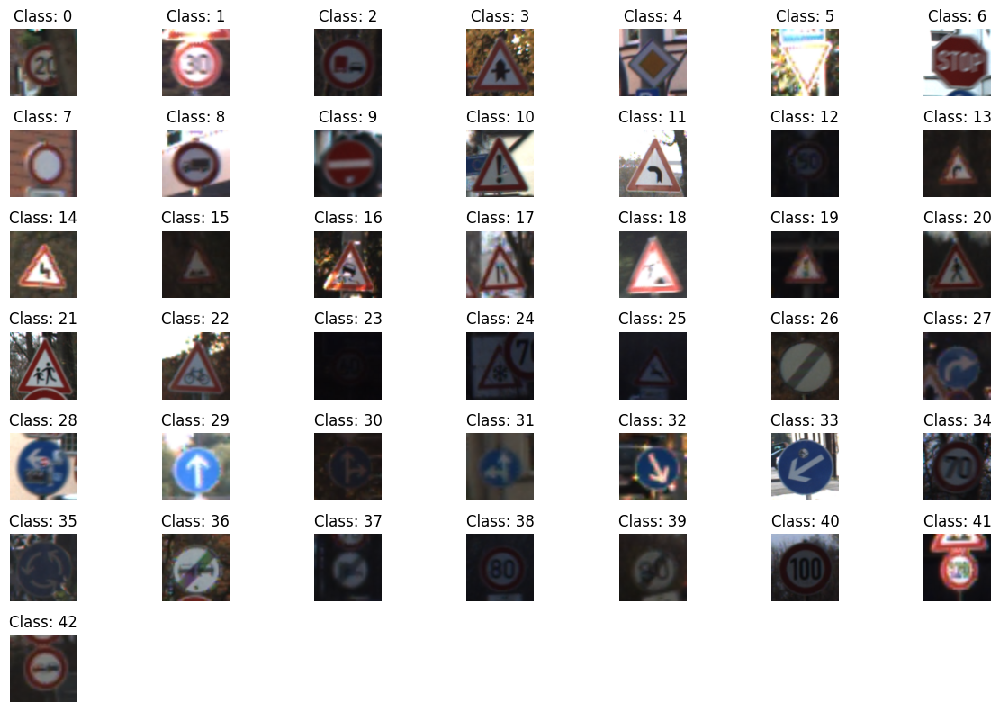

In [19]:
def imshow(img):
    img = img / 2 + 0.5  # Undo normalization
    img = img.numpy()
    plt.imshow(np.transpose(img, (1, 2, 0)))
    plt.axis('off')

# Store one image per class
class_count = {i: 0 for i in range(num_classes)}
ordered_images, ordered_labels = [], []

while len(ordered_images) < num_classes:
    dataiter = iter(train_dl)
    images, labels = next(dataiter)

    for i in range(len(images)):
        label = labels[i].item()
        if class_count[label] < 1:
            ordered_images.append(images[i])
            ordered_labels.append(label)
            class_count[label] += 1

image_label_pairs = list(zip(ordered_images, ordered_labels))
image_label_pairs.sort(key = lambda pair: pair[1]) # Sort by label

plt.figure(figsize = (12, 8))
num_images_per_row = 7

for i, (img, label) in enumerate(image_label_pairs):
    plt.subplot((num_classes + num_images_per_row - 1) // num_images_per_row, num_images_per_row, i + 1)
    imshow(img)
    plt.title(f'Class: {label}')

plt.tight_layout()
plt.show()

## Baseline model

There is not apllied softmax at the end, because we use cross-entropy loss funciton, which implicitly applies softmax before calculating the loss

In [ ]:
baseline_model = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Linear(64, num_classes),
)



```
model = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),#Used to flatten he output
    #nn.Flatten(), # Flatten the output for the linear layer
    nn.Linear(64, 43), # Linear layer to produce 35 outputs (logits)
)
```



In [ ]:
summary(baseline_model, input_size=(1, 3, 160, 160))

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [1, 43]                   --
├─Conv2d: 1-1                            [1, 16, 80, 80]           448
├─ReLU: 1-2                              [1, 16, 80, 80]           --
├─Conv2d: 1-3                            [1, 32, 40, 40]           4,640
├─ReLU: 1-4                              [1, 32, 40, 40]           --
├─Conv2d: 1-5                            [1, 64, 20, 20]           18,496
├─ReLU: 1-6                              [1, 64, 20, 20]           --
├─AdaptiveAvgPool2d: 1-7                 [1, 64, 1, 1]             --
├─Lambda: 1-8                            [1, 64]                   --
├─Linear: 1-9                            [1, 43]                   2,795
Total params: 26,379
Trainable params: 26,379
Non-trainable params: 0
Total mult-adds (M): 17.69
Input size (MB): 0.31
Forward/backward pass size (MB): 1.43
Params size (MB): 0.11
Estimated Total Size (MB): 1.85

### Train baseline model

In [ ]:
baseline_model.to(dev)
lr = 0.01
epochs = 15
loss_func = F.cross_entropy
opt = torch.optim.SGD(baseline_model.parameters(), lr=lr)
# opt = torch.optim.Adam(baseline_model.parameters(), lr=lr) # Adam optimizer

The output is the loss.

<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model not found at /content/gdrive/MyDrive/German-traffic-signs/baseline_model.pth, starting training.
Epoch 1/15 - Train Loss: 3.7230, Train Acc: 0.0562 - Val Loss: 3.6371, Val Acc: 0.0593
Epoch 2/15 - Train Loss: 3.5181, Train Acc: 0.0627 - Val Loss: 3.4741, Val Acc: 0.0687
Epoch 3/15 - Train Loss: 3.4753, Train Acc: 0.0735 - Val Loss: 3.4586, Val Acc: 0.0750
Epoch 4/15 - Train Loss: 3.4505, Train Acc: 0.0839 - Val Loss: 3.4314, Val Acc: 0.0804
Epoch 5/15 - Train Loss: 3.4249, Train Acc: 0.0866 - Val Loss: 3.4116, Val Acc: 0.0794
Epoch 6/15 - Train Loss: 3.4090, Train Acc: 0.0873 - Val Loss: 3.3986, Val Acc: 0.0859
Epoch 7/15 - Train Loss: 3.3986, Train Acc: 0.0904 - Val Loss: 3.3918, Val Acc: 0.0872
Epoch 8/15 - Train Loss: 3.3874, Train Acc: 0.0940 - Val Loss: 3.3786, Val Acc: 0.0966
Epoch 9/15 - Train Loss: 3.3700, Train Acc: 0.0984 - Val Loss: 3.3574, Val Acc: 0.1093
Epoch 10/15 - Train Loss: 3.3385, Train Acc: 0.1132 - Val Loss: 3.3222, Val Acc: 0.1008
Epoch 11/15 - Train Loss: 

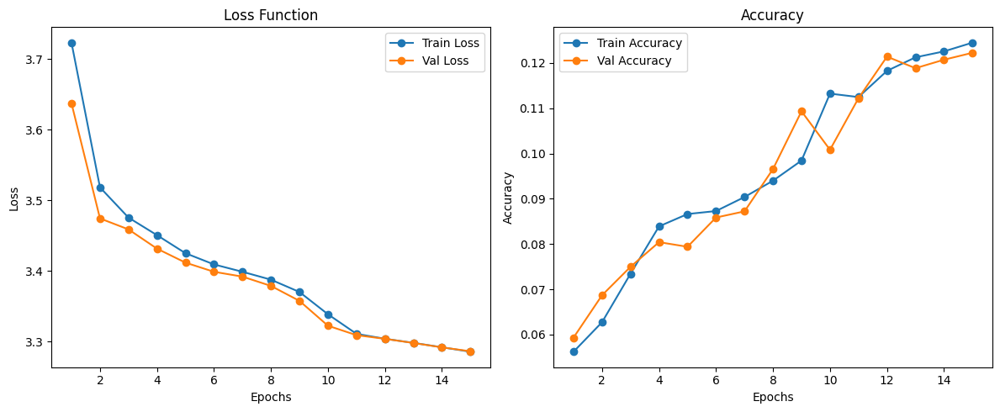

Model saved to /content/gdrive/MyDrive/German-traffic-signs/baseline_model.pth


In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/baseline_model.pth'
load_or_train_model(path_model, epochs, baseline_model, loss_func, opt, train_dl, val_dl)

In [ ]:
#fit(epochs, baseline_model, loss_func, opt, train_dl, val_dl)

Try some more epochs

In [ ]:
#fit(epochs, baseline_model, loss_func, opt, train_dl, val_dl)

It is very slow to find the minimum, therefore i will try with momentum. Could also try making a higher learning rate.

But it has not stopped learning completely so i try momentum first.

You could also say that it has started a bit overfitting, but now we will start with trying to make it find the minimum faster.
Adding momentum

In [ ]:
baseline_model1 = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Linear(64, num_classes),
)

In [ ]:
baseline_model1.to(dev)
lr = 0.01
epochs = 15
loss_func = F.cross_entropy
opt = torch.optim.SGD(baseline_model1.parameters(), lr=lr, momentum=0.9)

Model not found at /content/gdrive/MyDrive/German-traffic-signs/baseline_model1.pth, starting training.


<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Epoch 1/15 - Train Loss: 3.4785, Train Acc: 0.0727 - Val Loss: 3.3594, Val Acc: 0.0949
Epoch 2/15 - Train Loss: 3.1954, Train Acc: 0.1257 - Val Loss: 3.1126, Val Acc: 0.1314
Epoch 3/15 - Train Loss: 3.0684, Train Acc: 0.1402 - Val Loss: 3.0856, Val Acc: 0.1372
Epoch 4/15 - Train Loss: 3.0231, Train Acc: 0.1521 - Val Loss: 3.0041, Val Acc: 0.1486
Epoch 5/15 - Train Loss: 2.9945, Train Acc: 0.1584 - Val Loss: 2.9721, Val Acc: 0.1481
Epoch 6/15 - Train Loss: 2.9386, Train Acc: 0.1705 - Val Loss: 2.8954, Val Acc: 0.1843
Epoch 7/15 - Train Loss: 2.8366, Train Acc: 0.1987 - Val Loss: 2.8010, Val Acc: 0.2008
Epoch 8/15 - Train Loss: 2.7530, Train Acc: 0.2194 - Val Loss: 2.7855, Val Acc: 0.2171
Epoch 9/15 - Train Loss: 2.6786, Train Acc: 0.2409 - Val Loss: 2.7242, Val Acc: 0.2217
Epoch 10/15 - Train Loss: 2.6197, Train Acc: 0.2493 - Val Loss: 2.6202, Val Acc: 0.2443
Epoch 11/15 - Train Loss: 2.4888, Train Acc: 0.2750 - Val Loss: 2.5003, Val Acc: 0.2753
Epoch 12/15 - Train Loss: 2.4633, Train A

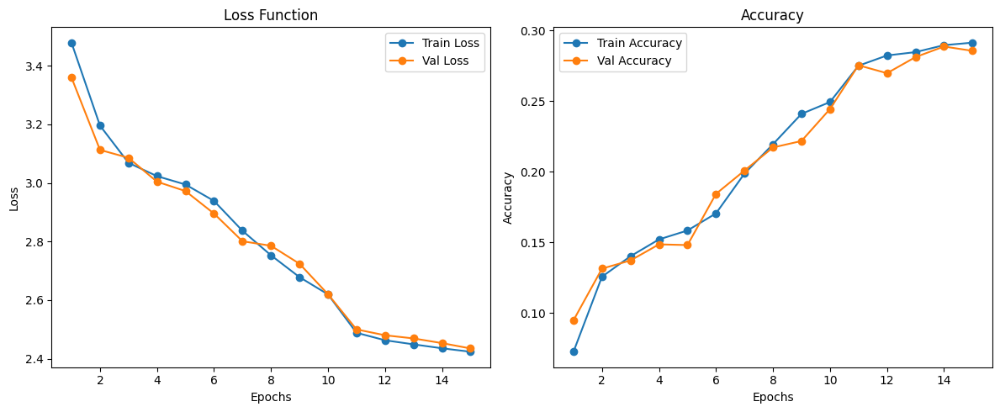

Model saved to /content/gdrive/MyDrive/German-traffic-signs/baseline_model1.pth


In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/baseline_model1.pth'
load_or_train_model(path_model, epochs, baseline_model1, loss_func, opt, train_dl, val_dl)

Still slow at finding minimum. Possible solutions could be another optimizer for example ADAM or changing learning rate
Trying with ADAM optimizer

In [ ]:
baseline_model2 = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),
    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Linear(64, num_classes),
)

In [ ]:
baseline_model2.to(dev)
lr = 0.01
epochs = 15
loss_func = F.cross_entropy
opt = torch.optim.Adam(baseline_model2.parameters(), lr=lr)

<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model not found at /content/gdrive/MyDrive/German-traffic-signs/baseline_model2.pth, starting training.
Epoch 1/15 - Train Loss: 3.2197, Train Acc: 0.1275 - Val Loss: 3.0600, Val Acc: 0.1542
Epoch 2/15 - Train Loss: 2.8662, Train Acc: 0.1955 - Val Loss: 2.7558, Val Acc: 0.2202
Epoch 3/15 - Train Loss: 2.6676, Train Acc: 0.2397 - Val Loss: 2.5879, Val Acc: 0.2636
Epoch 4/15 - Train Loss: 2.4154, Train Acc: 0.3047 - Val Loss: 2.3451, Val Acc: 0.3042
Epoch 5/15 - Train Loss: 2.1743, Train Acc: 0.3614 - Val Loss: 2.0611, Val Acc: 0.3753
Epoch 6/15 - Train Loss: 1.9829, Train Acc: 0.4123 - Val Loss: 1.9515, Val Acc: 0.3964
Epoch 7/15 - Train Loss: 1.9063, Train Acc: 0.4316 - Val Loss: 1.9245, Val Acc: 0.4086
Epoch 8/15 - Train Loss: 1.7674, Train Acc: 0.4672 - Val Loss: 1.7829, Val Acc: 0.4275
Epoch 9/15 - Train Loss: 1.6669, Train Acc: 0.4949 - Val Loss: 1.7277, Val Acc: 0.4627
Epoch 10/15 - Train Loss: 1.6168, Train Acc: 0.5090 - Val Loss: 1.6498, Val Acc: 0.4812
Epoch 11/15 - Train Loss:

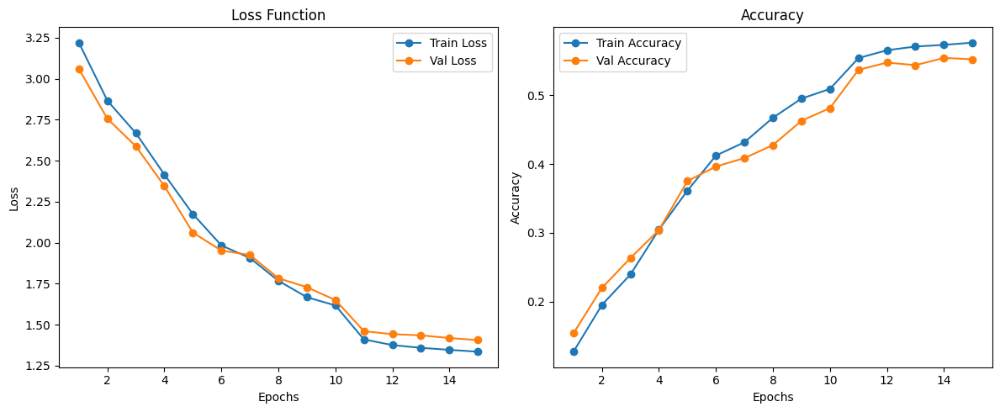

Model saved to /content/gdrive/MyDrive/German-traffic-signs/baseline_model2.pth


In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/baseline_model2.pth'
load_or_train_model(path_model, epochs, baseline_model2, loss_func, opt, train_dl, val_dl)

Stops learning. Try to add one more layer to the model. Maybe it is because the model is too simple. Actually overfitting


Try to make the model bigger so it can capture more complex data

In [ ]:
model_bigger = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor

    nn.Linear(128, num_classes),
)

In [ ]:
model_bigger.to(dev)
lr = 0.01
epochs = 15
loss_func = F.cross_entropy
opt = torch.optim.Adam(model_bigger.parameters(), lr=lr)

<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model not found at /content/gdrive/MyDrive/German-traffic-signs/model_bigger.pth, starting training.
Epoch 1/15 - Train Loss: 3.2574, Train Acc: 0.1133 - Val Loss: 3.0941, Val Acc: 0.1330
Epoch 2/15 - Train Loss: 2.9994, Train Acc: 0.1710 - Val Loss: 2.7855, Val Acc: 0.2233
Epoch 3/15 - Train Loss: 2.5739, Train Acc: 0.2840 - Val Loss: 2.2030, Val Acc: 0.3520
Epoch 4/15 - Train Loss: 1.8844, Train Acc: 0.4466 - Val Loss: 1.6893, Val Acc: 0.4611
Epoch 5/15 - Train Loss: 1.4913, Train Acc: 0.5607 - Val Loss: 1.4466, Val Acc: 0.5545
Epoch 6/15 - Train Loss: 1.1580, Train Acc: 0.6653 - Val Loss: 1.0880, Val Acc: 0.6581
Epoch 7/15 - Train Loss: 0.9613, Train Acc: 0.7266 - Val Loss: 0.9423, Val Acc: 0.7043
Epoch 8/15 - Train Loss: 0.8303, Train Acc: 0.7661 - Val Loss: 0.8588, Val Acc: 0.7335
Epoch 9/15 - Train Loss: 0.7022, Train Acc: 0.8080 - Val Loss: 1.0467, Val Acc: 0.7007
Epoch 10/15 - Train Loss: 0.6207, Train Acc: 0.8309 - Val Loss: 0.7372, Val Acc: 0.7727
Epoch 11/15 - Train Loss: 0.

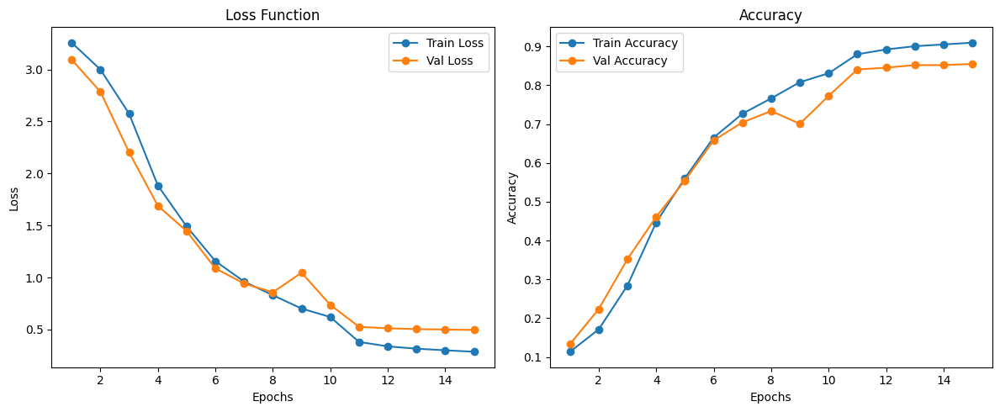

Model saved to /content/gdrive/MyDrive/German-traffic-signs/model_bigger.pth


In [ ]:
#fit(epochs, model_bigger, loss_func, opt, train_dl, val_dl)
path_model ='/content/gdrive/MyDrive/German-traffic-signs/model_bigger.pth'
load_or_train_model(path_model, epochs, model_bigger, loss_func, opt, train_dl, val_dl)

This was way better. Try with one more layer

In [ ]:
model_biggest = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Linear(256, num_classes),
)

In [ ]:
model_biggest.to(dev)
lr = 0.01
epochs = 15
loss_func = F.cross_entropy
opt = torch.optim.Adam(model_biggest.parameters(), lr=lr)

<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model not found at /content/gdrive/MyDrive/German-traffic-signs/model_biggest.pth, starting training.
Epoch 1/15 - Train Loss: 3.3687, Train Acc: 0.0971 - Val Loss: 3.0734, Val Acc: 0.1478
Epoch 2/15 - Train Loss: 2.7094, Train Acc: 0.2583 - Val Loss: 2.1097, Val Acc: 0.3998
Epoch 3/15 - Train Loss: 1.5078, Train Acc: 0.5901 - Val Loss: 1.0717, Val Acc: 0.6720
Epoch 4/15 - Train Loss: 0.8735, Train Acc: 0.7680 - Val Loss: 0.7397, Val Acc: 0.7762
Epoch 5/15 - Train Loss: 0.5941, Train Acc: 0.8491 - Val Loss: 0.6212, Val Acc: 0.8106
Epoch 6/15 - Train Loss: 0.4750, Train Acc: 0.8823 - Val Loss: 0.5462, Val Acc: 0.8471
Epoch 7/15 - Train Loss: 0.3495, Train Acc: 0.9203 - Val Loss: 0.3862, Val Acc: 0.8891
Epoch 8/15 - Train Loss: 0.2673, Train Acc: 0.9422 - Val Loss: 0.5500, Val Acc: 0.8507
Epoch 9/15 - Train Loss: 0.2687, Train Acc: 0.9440 - Val Loss: 0.4127, Val Acc: 0.8828
Epoch 10/15 - Train Loss: 0.2424, Train Acc: 0.9493 - Val Loss: 0.3139, Val Acc: 0.9100
Epoch 11/15 - Train Loss: 0

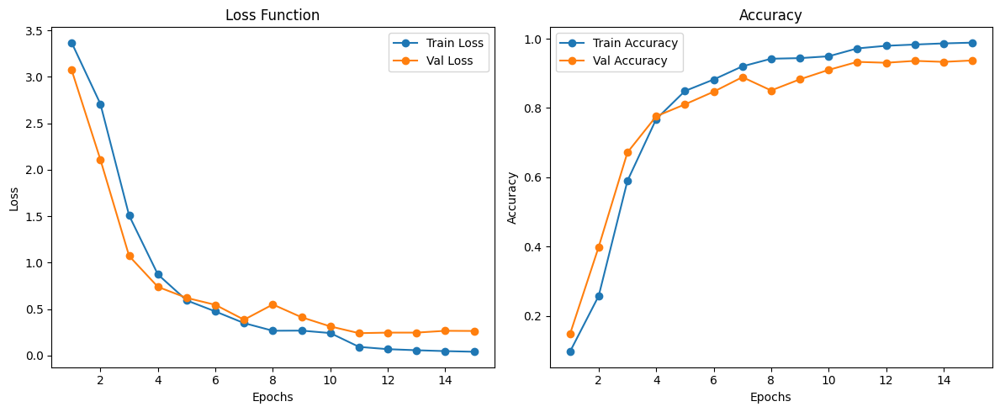

Model saved to /content/gdrive/MyDrive/German-traffic-signs/model_biggest.pth


In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/model_biggest.pth'
load_or_train_model(path_model, epochs, model_biggest, loss_func, opt, train_dl, val_dl)

In [ ]:
model_dropout = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.ReLU(),

    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Dropout(p=0.3),
    nn.Linear(256, num_classes),
)

In [ ]:
model_dropout.to(dev)
lr = 0.01
epochs = 15
loss_func = F.cross_entropy
opt = torch.optim.Adam(model_biggest.parameters(), lr=lr)

In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/model_dropout.pth'
load_or_train_model(path_model, epochs, model_dropout, loss_func, opt, train_dl, val_dl)

<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model not found at /content/gdrive/MyDrive/German-traffic-signs/model_dropout.pth, starting training.
Epoch 1/15 - Train Loss: 3.7586, Train Acc: 0.0177 - Val Loss: 3.7580, Val Acc: 0.0162
Epoch 2/15 - Train Loss: 3.7587, Train Acc: 0.0177 - Val Loss: 3.7580, Val Acc: 0.0162


KeyboardInterrupt: 

In [ ]:
#fit(epochs, model_biggest, loss_func, opt, train_dl, val_dl)

Seems like it is not learning.
This could be due to vanishing gradient. Try to add batch normalization



In [ ]:
model_batchnorm = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),

    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Linear(256, num_classes),
)

In [ ]:
model_batchnorm.to(dev)
lr = 0.01
epochs = 10
loss_func = F.cross_entropy
opt = torch.optim.Adam(model_batchnorm.parameters(), lr=lr)

<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model not found at /content/gdrive/MyDrive/German-traffic-signs/model_batchnorm.pth, starting training.
Epoch 1/10 - Train Loss: 2.4518, Train Acc: 0.3073 - Val Loss: 2.2003, Val Acc: 0.3567
Epoch 2/10 - Train Loss: 1.0996, Train Acc: 0.6937 - Val Loss: 0.6624, Val Acc: 0.7965
Epoch 3/10 - Train Loss: 0.3296, Train Acc: 0.9386 - Val Loss: 0.2929, Val Acc: 0.9192
Epoch 4/10 - Train Loss: 0.1328, Train Acc: 0.9839 - Val Loss: 0.1284, Val Acc: 0.9641
Epoch 5/10 - Train Loss: 0.0640, Train Acc: 0.9958 - Val Loss: 0.1162, Val Acc: 0.9667
Epoch 6/10 - Train Loss: 0.0458, Train Acc: 0.9982 - Val Loss: 0.4608, Val Acc: 0.8786
Epoch 7/10 - Train Loss: 0.0447, Train Acc: 0.9987 - Val Loss: 0.1069, Val Acc: 0.9658
Epoch 8/10 - Train Loss: 0.0252, Train Acc: 0.9995 - Val Loss: 0.0579, Val Acc: 0.9835
Epoch 9/10 - Train Loss: 0.0235, Train Acc: 0.9998 - Val Loss: 0.2104, Val Acc: 0.9452
Epoch 10/10 - Train Loss: 0.0333, Train Acc: 0.9995 - Val Loss: 0.1161, Val Acc: 0.9672


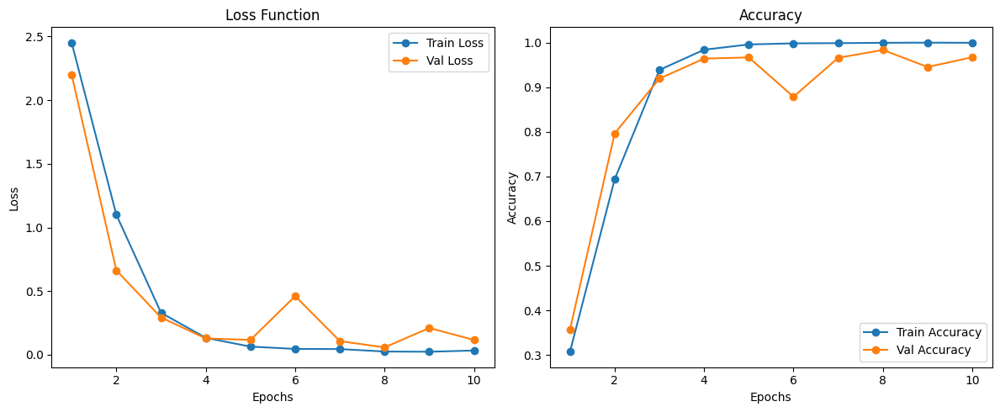

Model saved to /content/gdrive/MyDrive/German-traffic-signs/model_batchnorm.pth


In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/model_batchnorm.pth'
load_or_train_model(path_model, epochs, model_batchnorm, loss_func, opt, train_dl, val_dl)

Now it seems like it is startung to overfit a bit on the training data (not much?), will therefore try using dropout. Maybe i will also add one more layer.



In [ ]:
model_dropout = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),

    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Dropout(p=0.3),
    nn.Linear(256, num_classes),
)

In [ ]:
model_dropout.to(dev)
lr = 0.01
epochs = 20
loss_func = F.cross_entropy
opt = torch.optim.Adam(model_dropout.parameters(), lr=lr)

In [ ]:
#fit(epochs, model_dropout, loss_func, opt, train_dl, val_dl)

In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/model_dropout.pth'
load_or_train_model(path_model, epochs, model_dropout, loss_func, opt, train_dl, val_dl)

Here we see val acc higher than train acc. This is due to the fact that we use dropotu and this is only applied during training

Truy with dropout 0.5

In [ ]:
modeldropout05_2 = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.AdaptiveAvgPool2d(1),

    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Linear(256, 128),  # Linear layer. In step by step model we do not have this layer
    nn.ReLU(), #we do not have this either
    nn.Dropout(0.5),  # Dropout applied here for the dense layer

    nn.Linear(128, num_classes)
)

In [ ]:
modeldropout05_2.to(dev)
lr = 0.01
epochs = 25
loss_func = F.cross_entropy
opt = torch.optim.Adam(modeldropout05_2.parameters(), lr=lr) # Adam optimizer

<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model not found at /content/gdrive/MyDrive/German-traffic-signs/modeldropout05_2.pth, starting training.
Epoch 1/25 - Train Loss: 3.1303, Train Acc: 0.1418 - Val Loss: 2.7990, Val Acc: 0.2003
Epoch 2/25 - Train Loss: 2.4524, Train Acc: 0.2586 - Val Loss: 1.9412, Val Acc: 0.3596
Epoch 3/25 - Train Loss: 1.9966, Train Acc: 0.3551 - Val Loss: 1.6322, Val Acc: 0.4360
Epoch 4/25 - Train Loss: 1.8051, Train Acc: 0.4061 - Val Loss: 1.5150, Val Acc: 0.4787
Epoch 5/25 - Train Loss: 1.5285, Train Acc: 0.5007 - Val Loss: 1.0014, Val Acc: 0.6909
Epoch 6/25 - Train Loss: 1.1985, Train Acc: 0.6102 - Val Loss: 0.6147, Val Acc: 0.8055
Epoch 7/25 - Train Loss: 1.0029, Train Acc: 0.6783 - Val Loss: 0.5548, Val Acc: 0.8312
Epoch 8/25 - Train Loss: 0.8786, Train Acc: 0.7161 - Val Loss: 0.3878, Val Acc: 0.8893
Epoch 9/25 - Train Loss: 0.7821, Train Acc: 0.7525 - Val Loss: 0.2839, Val Acc: 0.9191
Epoch 10/25 - Train Loss: 0.7329, Train Acc: 0.7689 - Val Loss: 0.3867, Val Acc: 0.8815
Epoch 11/25 - Train Loss

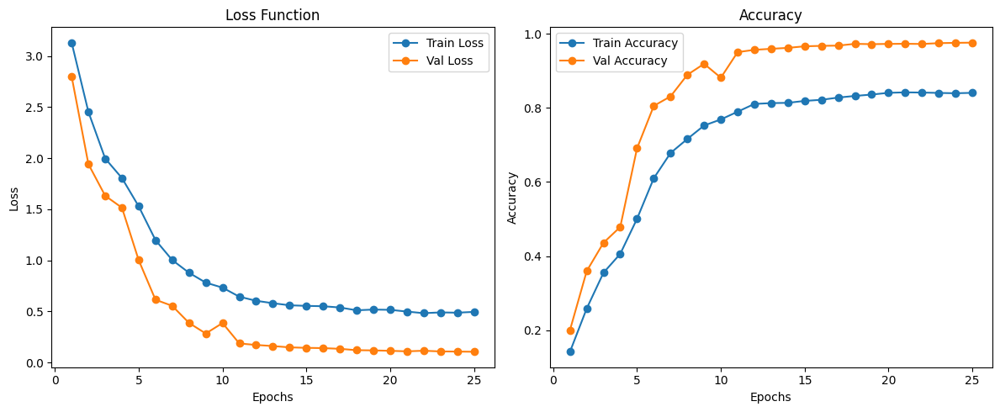

Model saved to /content/gdrive/MyDrive/German-traffic-signs/modeldropout05_2.pth


In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/modeldropout05_2.pth'
load_or_train_model(path_model, epochs, modeldropout05_2, loss_func, opt, train_dl, val_dl)

Not that much difference comapred to dropout 0.5. Doesn't matter which to choose

Try with one more layer

In [ ]:
modelbig = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),

    nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(512),
    nn.ReLU(),
    nn.AdaptiveAvgPool2d(1),

    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Linear(512, 256),  # Linear layer. In step by step model we do not have this layer
    nn.Linear(256, 128),
    nn.ReLU(), #we do not have this either

    nn.Dropout(0.5),  # Dropout applied here for the dense layer

    nn.Linear(128, num_classes)
)

In [ ]:
modelbig.to(dev)
lr = 0.01
epochs = 25
loss_func = F.cross_entropy
opt = torch.optim.Adam(modelbig.parameters(), lr=lr) # Adam optimizer

In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/modelbig.pth'
load_or_train_model(path_model, epochs, modelbig, loss_func, opt, train_dl, val_dl)

Did not do anything good

### Visualize some predictions

In [ ]:
def denormalize(img):
    img = img / 2 + 0.5  # assuming the images were normalized to [-1, 1]
    return img.clamp(0, 1)  # clamp values to [0, 1]

# Modified show_images function with denormalization
def show_images(images, labels, preds, num_images=10):
    images = denormalize(images)  # Denormalize before displaying
    plt.figure(figsize=(10, 10))

    # Limit to the specified number of images (default is 5)
    for i in range(min(num_images, len(images))):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(images[i].permute(1, 2, 0).cpu().numpy())  # Assuming images are in [C, H, W] format
        plt.title(f'True: {labels[i]}\nPred: {preds[i]}')
        plt.axis('off')
    plt.show()


## Data augmentation

Consider adding some data augmentation

## Final model (batch normalization, dropout, bigger model). Uses one more linear layer than before

In [21]:
model = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(16),
    nn.ReLU(),

    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(32),
    nn.ReLU(),

    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(64),
    nn.ReLU(),

    nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(128),
    nn.ReLU(),

    nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(256),
    nn.ReLU(),
    nn.AdaptiveAvgPool2d(1),

    Lambda(lambda x: x.view(x.size(0), -1)),  # Flattening the tensor
    nn.Linear(256, 128),  # Linear layer. In step by step model we do not have this layer
    nn.ReLU(), #we do not have this either
    nn.Dropout(0.5),  # Dropout applied here for the dense layer

    nn.Linear(128, num_classes)
)

In [ ]:
summary(model, input_size=(1, 3, 160, 160))

Layer (type:depth-idx)                   Output Shape              Param #
Sequential                               [1, 43]                   --
├─Conv2d: 1-1                            [1, 16, 80, 80]           448
├─BatchNorm2d: 1-2                       [1, 16, 80, 80]           32
├─ReLU: 1-3                              [1, 16, 80, 80]           --
├─Conv2d: 1-4                            [1, 32, 40, 40]           4,640
├─BatchNorm2d: 1-5                       [1, 32, 40, 40]           64
├─ReLU: 1-6                              [1, 32, 40, 40]           --
├─Conv2d: 1-7                            [1, 64, 20, 20]           18,496
├─BatchNorm2d: 1-8                       [1, 64, 20, 20]           128
├─ReLU: 1-9                              [1, 64, 20, 20]           --
├─Conv2d: 1-10                           [1, 128, 10, 10]          73,856
├─BatchNorm2d: 1-11                      [1, 128, 10, 10]          256
├─ReLU: 1-12                             [1, 128, 10, 10]          --
├



```
model = nn.Sequential(
    nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(16),  # batch normalization here
    nn.ReLU(),
    nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(32),  # batch normalization here
    nn.ReLU(),
    nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
    nn.BatchNorm2d(64),  # batch normalization here
    nn.ReLU(),
    nn.AdaptiveAvgPool2d(1),
    Lambda(lambda x: x.view(x.size(0), -1)),
    nn.Linear(64, 43), # Linear layer to produce 35 outputs (logits)
)
```



### Train model

In [22]:
model.to(dev)
lr = 0.01
epochs = 20
loss_func = F.cross_entropy
opt = torch.optim.Adam(model.parameters(), lr=lr) # Adam optimizer

<ipython-input-11-9206ab618b84>:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path))


Model not found at /content/gdrive/MyDrive/German-traffic-signs/model.pth, starting training.
Epoch 1/20 - Train Loss: 3.0735, Train Acc: 0.1437 - Val Loss: 2.5708, Val Acc: 0.2256
Epoch 2/20 - Train Loss: 2.3264, Train Acc: 0.2885 - Val Loss: 1.8268, Val Acc: 0.3896
Epoch 3/20 - Train Loss: 1.8842, Train Acc: 0.3912 - Val Loss: 1.6850, Val Acc: 0.4749
Epoch 4/20 - Train Loss: 1.6127, Train Acc: 0.4726 - Val Loss: 1.1572, Val Acc: 0.6252
Epoch 5/20 - Train Loss: 1.2613, Train Acc: 0.5964 - Val Loss: 0.9609, Val Acc: 0.7233
Epoch 6/20 - Train Loss: 0.9681, Train Acc: 0.6926 - Val Loss: 0.4611, Val Acc: 0.8646
Epoch 7/20 - Train Loss: 0.7701, Train Acc: 0.7544 - Val Loss: 0.3372, Val Acc: 0.9056
Epoch 8/20 - Train Loss: 0.6426, Train Acc: 0.7909 - Val Loss: 0.2180, Val Acc: 0.9432
Epoch 9/20 - Train Loss: 0.5626, Train Acc: 0.8184 - Val Loss: 0.1718, Val Acc: 0.9589
Epoch 10/20 - Train Loss: 0.5026, Train Acc: 0.8394 - Val Loss: 0.1498, Val Acc: 0.9634
Epoch 11/20 - Train Loss: 0.3933, T

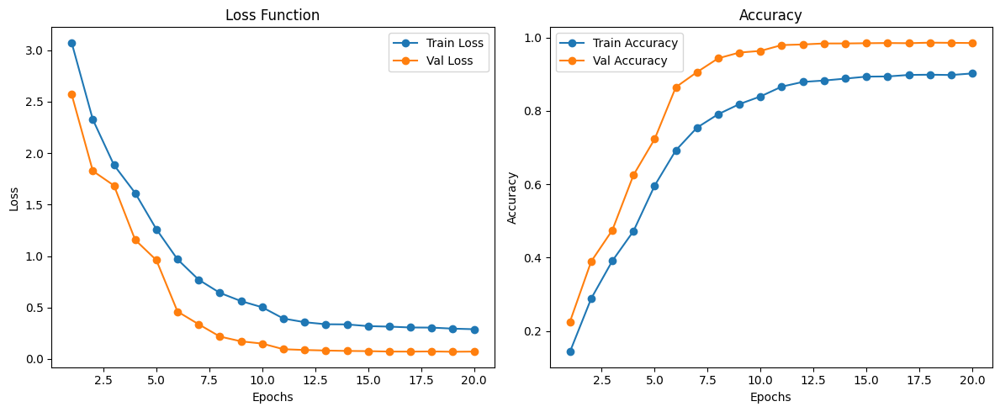

Model saved to /content/gdrive/MyDrive/German-traffic-signs/model.pth


In [ ]:
path_model ='/content/gdrive/MyDrive/German-traffic-signs/model.pth'
load_or_train_model(path_model, epochs, model, loss_func, opt, train_dl, val_dl)

# fit(epochs, model, loss_func, opt, train_dl, val_dl)

### Visualize some predictions

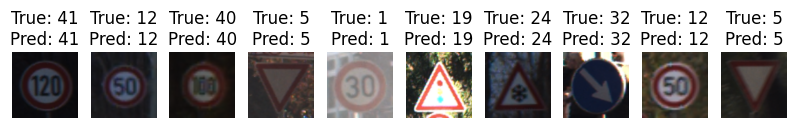

Sequential(
  (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU()
  (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU()
  (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (14): ReLU()
  (15): AdaptiveAvgPool2d(output_size=1)
  (16): Lambda()
  (17): Linear(in_features=256, out_features=128, b

In [ ]:
model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    for images, labels in val_dl:  # val_dl is your validation dataloader
        images, labels = images.to(dev), labels.to(dev)  # Move to device if necessary
        outputs = model(images)  # Get model predictions
        _, preds = torch.max(outputs, 1)  # Get predicted class index

        # Show images and their predicted labels
        show_images(images.cpu(), labels.cpu(), preds.cpu())
        break  # Show only one batch of images

# revert model back to train mode
model.train()

Try to make confusion matrix

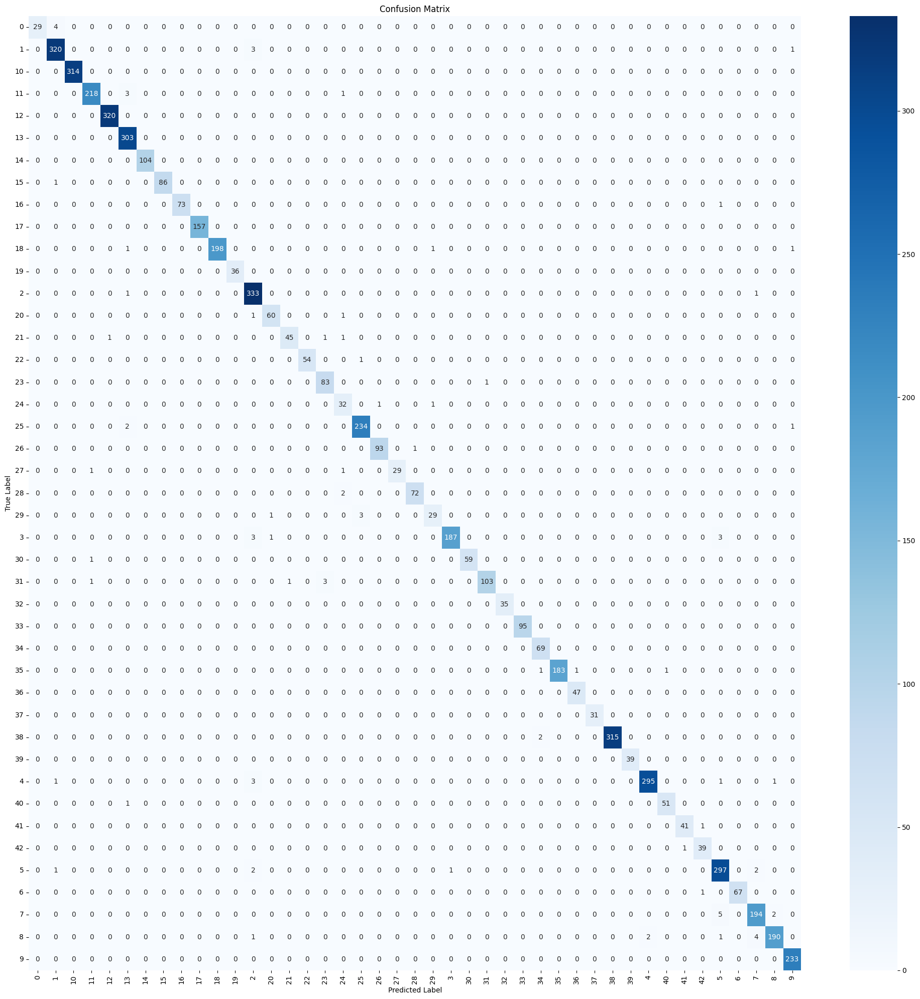

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Get predictions and true labels for the test set
y_pred = []
y_true = []

model.eval()  # Set the model to evaluation mode
with torch.no_grad():
    for images, labels in val_dl:
        images, labels = images.to(dev), labels.to(dev)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())

# Generate the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Class names for the German Traffic Sign dataset
class_names = full_dataset.classes

# Visualize the confusion matrix
plt.figure(figsize=(20, 20))  # Adjust figure size as needed
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.yticks(rotation=0)   # Keep y-axis labels vertical
plt.tight_layout()      # Adjust layout to prevent labels from overlapping
plt.show()

# GradCAM


In [26]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None    # To store gradients
        self.activations = None  # To store activations

    def save_gradient(self, grad):
        self.gradients = grad

    def forward_hook(self, module, input, output):
        self.activations = output
        output.register_hook(self.save_gradient)  # Register the gradient hook

    def __call__(self, x, class_idx=None):
        # Register forward hook on the target layer
        target_layer = dict(self.model.named_modules())[self.target_layer]
        handle = target_layer.register_forward_hook(self.forward_hook)

        # Forward pass
        output = self.model(x)
        if class_idx is None:
            class_idx = torch.argmax(output)  # Use the predicted class if not specified
        loss = output[:, class_idx]

        # Backward pass
        self.model.zero_grad()
        loss.backward()

        # Remove the hook
        handle.remove()

        # Calculate Grad-CAM
        grads = self.gradients.detach().cpu().numpy()[0]  # Gradients
        activations = self.activations.detach().cpu().numpy()[0]  # Activations
        weights = np.mean(grads, axis=(1, 2))  # Global average pooling over the gradients

        cam = np.zeros(activations.shape[1:], dtype=np.float32)
        for i, w in enumerate(weights):
            cam += w * activations[i]

        cam = np.maximum(cam, 0)  # ReLU to keep only positive values
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        return cam

In [28]:

def evaluate_and_get_misclassified(model, test_dl, loss_func, device):
    model.eval()
    total_loss, total_correct = 0.0, 0
    total_samples = 0
    misclassified = []  # List to store misclassified samples

    with torch.no_grad():
        for xb, yb in test_dl:
            xb, yb = xb.to(device), yb.to(device)

            # Compute loss
            loss, _ = loss_batch(model, loss_func, xb, yb)
            total_loss += loss

            # Get predictions
            preds = model(xb).argmax(dim=1)

            # Calculate accuracy
            total_correct += (preds == yb).sum().item()
            total_samples += yb.size(0)

            # Identify and store misclassified samples
            for i in range(len(yb)):
                if preds[i].item() != yb[i].item():
                    misclassified.append((xb[i].cpu(), yb[i].item(), preds[i].item()))

    # Calculate overall metrics
    test_loss = total_loss / len(test_dl)
    test_acc = total_correct / total_samples
    print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}")

    # Return metrics and misclassified samples
    return test_loss, test_acc, misclassified

### Show misclassified images

In [30]:
evaluate_and_get_misclassified(model, test_dl, loss_func, dev)

Test Loss: 0.0664, Test Accuracy: 0.9861


(0.06636634768675202,
 0.9860591635498129,
 [(tensor([[[-0.5216, -0.5216, -0.5216,  ..., -0.4510, -0.4510, -0.4510],
            [-0.5216, -0.5216, -0.5216,  ..., -0.4510, -0.4510, -0.4510],
            [-0.5216, -0.5216, -0.5216,  ..., -0.4510, -0.4510, -0.4510],
            ...,
            [-0.1216, -0.1216, -0.1216,  ...,  0.2706,  0.2706,  0.2706],
            [-0.1216, -0.1216, -0.1216,  ...,  0.2706,  0.2706,  0.2706],
            [-0.1216, -0.1216, -0.1216,  ...,  0.2706,  0.2706,  0.2706]],
   
           [[-0.4745, -0.4745, -0.4745,  ..., -0.4588, -0.4588, -0.4588],
            [-0.4745, -0.4745, -0.4745,  ..., -0.4588, -0.4588, -0.4588],
            [-0.4745, -0.4745, -0.4745,  ..., -0.4588, -0.4588, -0.4588],
            ...,
            [-0.0824, -0.0824, -0.0824,  ...,  0.5529,  0.5529,  0.5529],
            [-0.0824, -0.0824, -0.0824,  ...,  0.5529,  0.5529,  0.5529],
            [-0.0824, -0.0824, -0.0824,  ...,  0.5529,  0.5529,  0.5529]],
   
           [[-0.5765, -0.

### Visualize misclassified images with Grad-CAM

In [31]:
def get_misclassified_images(neural_net, test_loader, device):
    """ Function to get misclassified images """
    neural_net.eval()
    misclassified = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = neural_net(inputs)
            preds = torch.argmax(outputs, dim=1)
            for i in range(len(inputs)):
                if preds[i] != labels[i]:
                    misclassified.append((inputs[i].cpu(), labels[i].item(), preds[i].item()))
    return misclassified

In [32]:
def show_cam_on_image(img: np.ndarray, mask: np.ndarray, alpha: float = 0.5) -> np.ndarray:
    """
    Overlay a Grad-CAM heatmap (mask) on an image.

    Args:
        img (np.ndarray): Original image (H, W, C) in the range [0, 1].
        mask (np.ndarray): Grad-CAM heatmap (H, W) in the range [0, 1].
        alpha (float): Blending factor for overlay.

    Returns:
        np.ndarray: Image with Grad-CAM heatmap overlay.
    """
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)  # Convert mask to heatmap
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

    overlay = heatmap / 255.0 + img  # Combine heatmap with image
    overlay = overlay / overlay.max()  # Normalize to range [0, 1]

    return np.uint8(255 * overlay)  # Convert to range [0, 255]


In [33]:
def visualize_misclassified_with_gradcam(neural_net, misclassified, grad_cam, target_layer):
    """ Visualize misclassified images with Grad-CAM"""
    neural_net.eval()  # Ensure model is in evaluation mode
    for i, (img, true_label, pred_label) in enumerate(misclassified):
        # Prepare image for Grad-CAM
        img_input = img.unsqueeze(0).to(dev)                    # Add batch dimension
        mask = grad_cam(img_input, class_idx=pred_label)        # Grad-CAM for predicted label

        # Normalize Grad-CAM mask
        mask = cv2.resize(mask, (img.shape[1], img.shape[2]))   # Resize mask to match image
        mask = (mask - mask.min()) / (mask.max() - mask.min())  # Normalize [0, 1]

        # Convert image for visualization
        img_np = img.permute(1, 2, 0).numpy()  # Convert to HWC
        img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())  # Normalize [0, 1]
        img_np = cv2.resize(img_np, (mask.shape[1], mask.shape[0]))       # Match dimensions

        # Create overlay
        overlay = show_cam_on_image(img_np, mask, alpha=0.6)

        # Plot image, overlay, and labels
        plt.figure(figsize=(6, 3))  # Increase figure size
        plt.subplot(1, 2, 1)
        plt.imshow(img_np)
        plt.title(f"True: {true_label}, Pred: {pred_label}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(overlay)
        plt.title("Grad-CAM")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

#### Finding target layer ID (ID for the last convolutional layer in the CNN)

In [35]:
print(model)

Sequential(
  (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU()
  (9): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU()
  (12): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (13): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (14): ReLU()
  (15): AdaptiveAvgPool2d(output_size=1)
  (16): Lambda()
  (17): Linear(in_features=256, out_features=128, b

#### Visualize for last convolutional layer

Number of misclassified images: 82


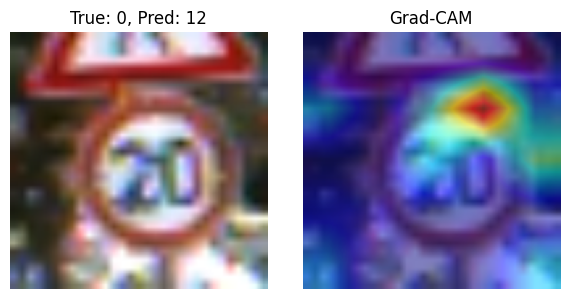

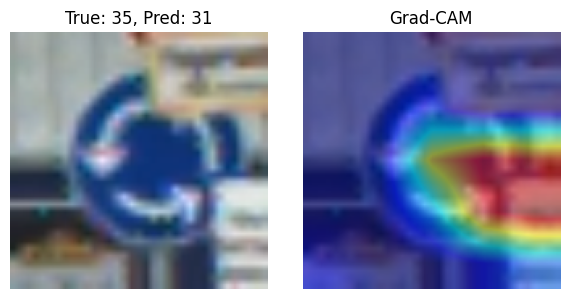

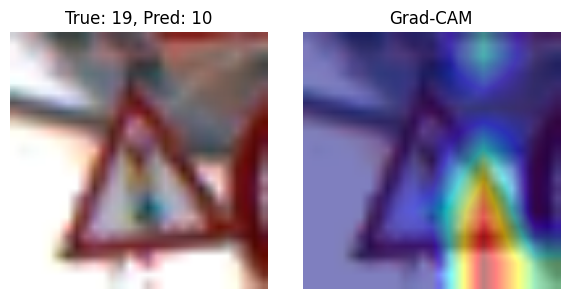

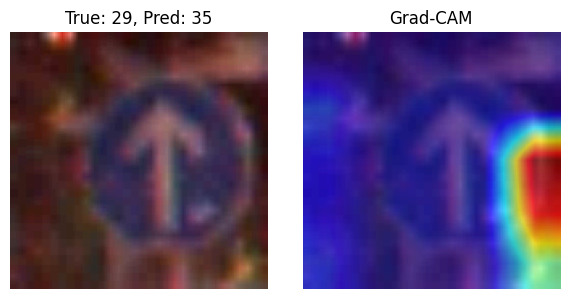

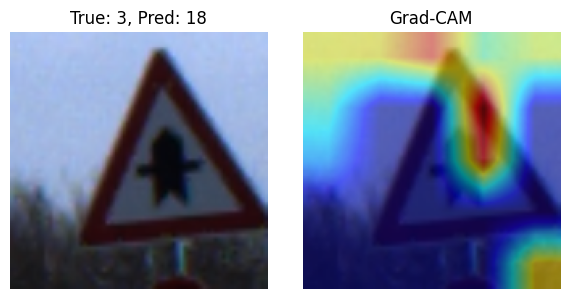

...

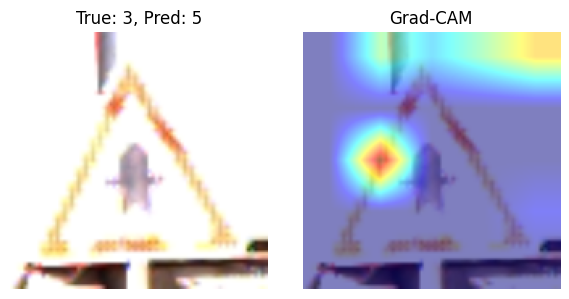

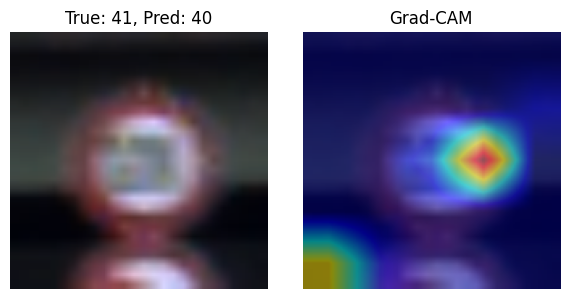

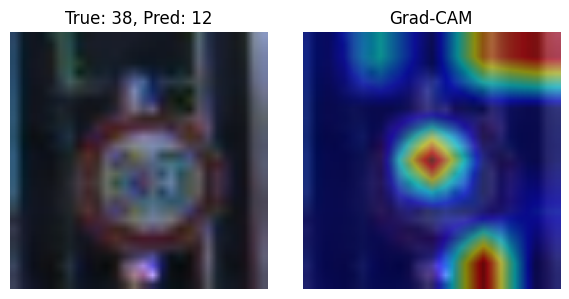

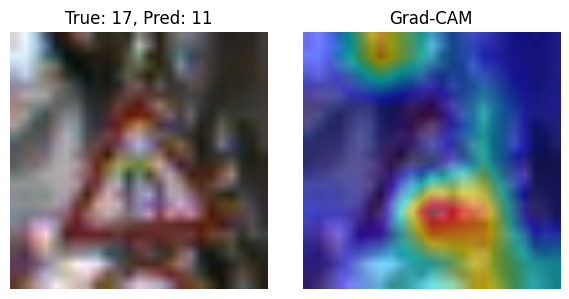

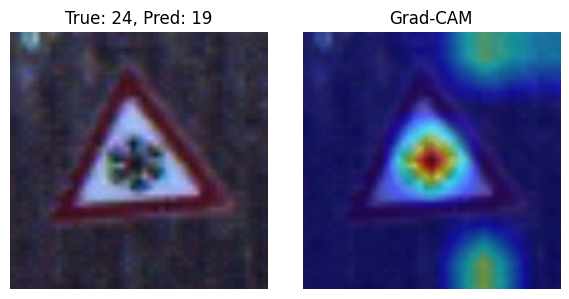

<ipython-input-26-b9ded5e2fea2>:44: RuntimeWarning: invalid value encountered in divide
  cam = cam / np.max(cam)
<ipython-input-32-6769dcfc4eea>:13: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)  # Convert mask to heatmap


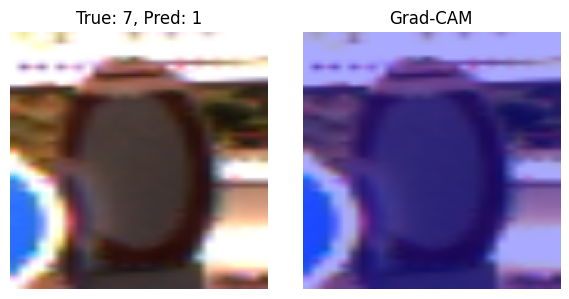

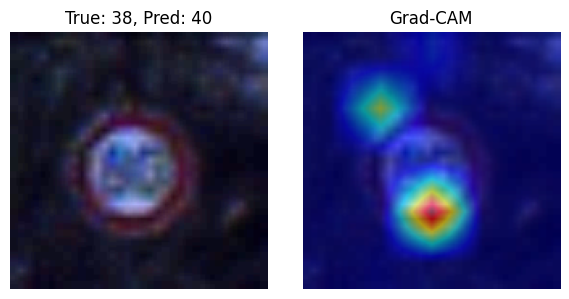

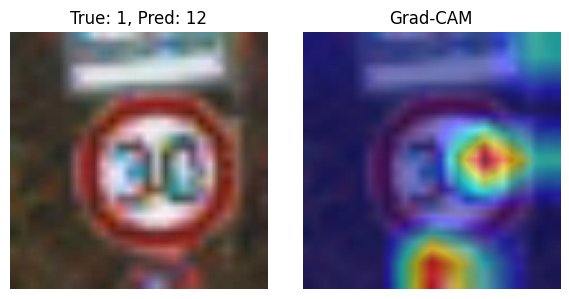

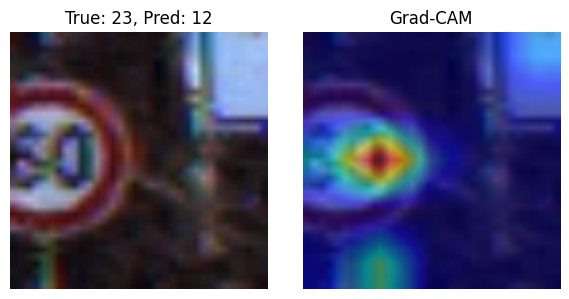

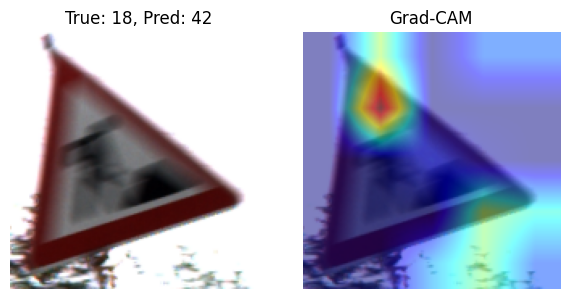

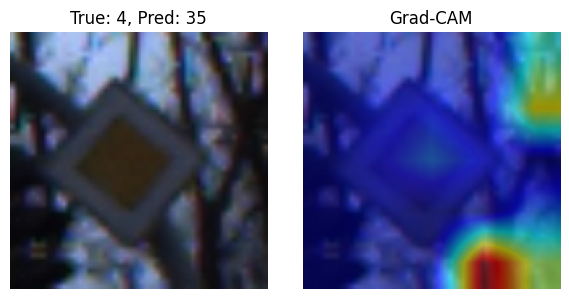

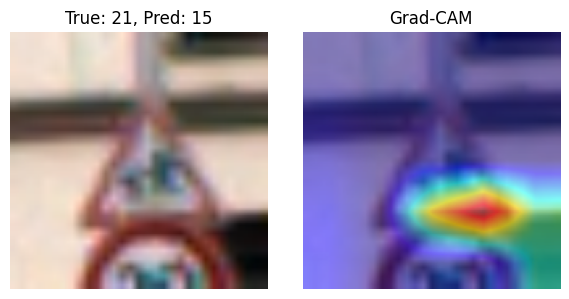

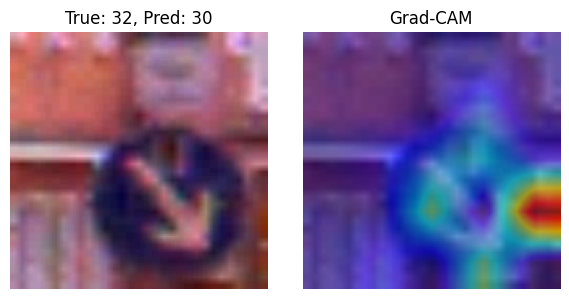

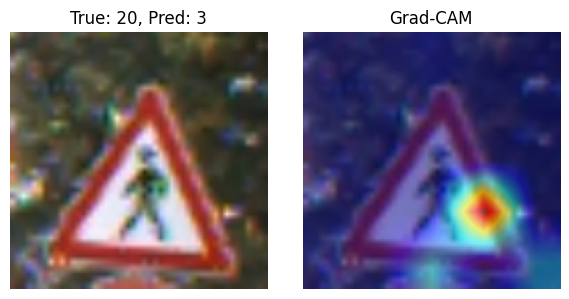

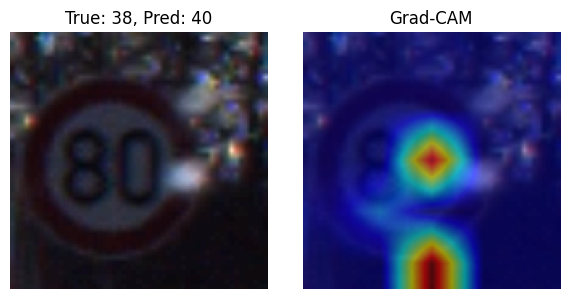

In [40]:

# Get misclassified images
misclassified = get_misclassified_images(model, test_dl, dev)
print(f"Number of misclassified images: {len(misclassified)}")

#Initialize Grad-CAM
target_layer = '12'  # Target layer is set as the last convolutional layer in the CNN
grad_cam = GradCAM(model, target_layer = target_layer)

# Visualize misclassified images with Grad-CAM
visualize_misclassified_with_gradcam(model, misclassified, grad_cam, target_layer)

### Explanations to odd patterns in Grad-CAM heatmaps
The model is overgeneralizing:
- The model might not have learned meaningful spatial features from the training data and is relying on non-specific patterns or global statistics to make predictions.
- Example: Instead of recognizing the distinctive shapes or textures of a traffic sign, it might be relying on overall color distribution or brightness.

Bad target layer:
- The chosen layer for Grad-CAM visualization may not be optimal.
- If the selected convolutional layer is too early in the network, it might focus on low-level features (e.g., edges, textures) that are distributed across the image.
- Conversely, if it’s too deep, the network might have pooled features into a highly compressed representation, leading to uniform gradients.

Class ambiguity:
- If the model is uncertain about the prediction or if the image contains ambiguous features, Grad-CAM might spread the importance across the entire image.

Overfitting to backgrounds:
- If the model was trained on data where the background frequently correlated (e.g., close-up images) with specific classes, it might learn to use the background as a feature. Grad-CAM would then highlight the entire image, including the background.

Grad-CAM Implementation Issues:
- There might be a bug or mismatch in the Grad-CAM implementation, such as incorrect gradient computation, improper handling of feature maps, or resizing errors.